In [1]:
%pylab inline
!pip install natsort

import torch
import torchvision
import numpy as np
import matplotlib.pyplot as plt
import os
from zipfile import ZipFile
from natsort import natsorted
from PIL import Image

torch.manual_seed(1)

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com


In [2]:
class ConvBlock(torch.nn.Module):
    def __init__(self, in_c, out_c, kernel, stride, padding):
        super().__init__()
        self.convos = torch.nn.Sequential(
            torch.nn.Conv2d(in_c, out_c, kernel, stride, padding, padding_mode = "reflect"),
            torch.nn.InstanceNorm2d(out_c),
            torch.nn.ReLU(),
        )
    def forward(self, x):
        result = self.convos(x)
        return result

class LeakyConvBlock(torch.nn.Module):
    def __init__(self, in_c, out_c, kernel, stride, padding):
        super().__init__()
        self.convos = torch.nn.Sequential(
            torch.nn.Conv2d(in_c, out_c, kernel, stride, padding, padding_mode = "reflect"),
            torch.nn.InstanceNorm2d(out_c),
            torch.nn.LeakyReLU(0.2),
        )
    def forward(self, x):
        result = self.convos(x)
        return result
    
class TransposeBlock(torch.nn.Module):
    def __init__(self, in_c, out_c, kernel, stride, padding, out_pad):
        super().__init__()
        self.convos = torch.nn.Sequential(
            torch.nn.ConvTranspose2d(in_c, out_c, kernel, stride, padding, out_pad),
            torch.nn.InstanceNorm2d(out_c),
            torch.nn.ReLU(),
        )
    def forward(self, x):
        result = self.convos(x)
        return result

In [3]:
class Residual(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.convos = torch.nn.Sequential(
            torch.nn.Conv2d(256, 256, 3, 1, 1, padding_mode = "reflect"),
            torch.nn.InstanceNorm2d(256),
            torch.nn.ReLU(),
            torch.nn.Conv2d(256, 256, 3, 1, 1, padding_mode = "reflect"),
            torch.nn.InstanceNorm2d(256),
        )
    def forward(self, x):
        result = x + self.convos(x)
        return result

In [4]:
class Generator(torch.nn.Module):
    def __init__(self):
        super().__init__()
        # 3 256 256
        self.down = torch.nn.Sequential(
            ConvBlock(3, 64, 7, 1, 3),
            ConvBlock(64, 128, 3, 2, 1),
            ConvBlock(128, 256, 3, 2, 1),
        )
        self.residuals = torch.nn.Sequential(
            *[Residual() for x in range(9)]
        )
        self.up = torch.nn.Sequential(
            TransposeBlock(256, 128, 3, 2, 1, 1),
            TransposeBlock(128, 64, 3, 2, 1, 1),
            torch.nn.Conv2d(64, 3, 7, 1, 3),
        )
        # 3 256 256
        self.tanh = torch.nn.Tanh()
    def forward(self, x):
        x = self.down(x)
        x = self.residuals(x)
        x = self.up(x)
        return self.tanh(x)

In [5]:
class Discriminator(torch.nn.Module):
    def __init__(self, input_nc):
        super(Discriminator, self).__init__()

        model = [   torch.nn.Conv2d(input_nc, 64, 4, stride=2, padding=1),
                    torch.nn.LeakyReLU(0.2, inplace=True) ]

        model += [  torch.nn.Conv2d(64, 128, 4, stride=2, padding=1),
                    torch.nn.InstanceNorm2d(128), 
                    torch.nn.LeakyReLU(0.2, inplace=True) ]

        model += [  torch.nn.Conv2d(128, 256, 4, stride=2, padding=1),
                    torch.nn.InstanceNorm2d(256), 
                    torch.nn.LeakyReLU(0.2, inplace=True) ]

        model += [  torch.nn.Conv2d(256, 512, 4, padding=1),
                    torch.nn.InstanceNorm2d(512), 
                    torch.nn.LeakyReLU(0.2, inplace=True) ]

        model += [torch.nn.Conv2d(512, 1, 4, padding=1)]

        self.model = torch.nn.Sequential(*model)

    def forward(self, x):
        x =  self.model(x)
        # Average pooling and flatten
        return torch.nn.functional.avg_pool2d(x, x.size()[2:]).view(x.size()[0], -1)

In [6]:
class CustomDataset(torch.utils.data.Dataset):
    """
        Returns summer and winter images
    """
    def __init__(self, first_dir, second_dir, transform):
        self.first_dir = first_dir
        self.second_dir = second_dir
        self.transform = transform
        first_imgs, second_imgs = os.listdir(first_dir), os.listdir(second_dir)
        self.total_first = natsorted(first_imgs)
        self.total_second = natsorted(second_imgs)

    def __len__(self):
        return len(self.total_first)
    
    def __getitem__(self, idx):
        img_loc1 = os.path.join(self.first_dir, self.total_first[idx])
        img_loc2 = os.path.join(self.second_dir, self.total_second[idx])
        image1 = Image.open(img_loc1).convert("RGB")
        image2 = Image.open(img_loc2).convert("RGB")
        
        image1, image2 = self.transform(image1), self.transform(image2)
        return image1, image2

In [12]:
std_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize((256, 256)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])
ds = CustomDataset('images_zebras/horse2zebra/testA', 'images_zebras/horse2zebra/testB', transform=std_transform)
images_loader = torch.utils.data.DataLoader(ds, batch_size=1, shuffle = True, drop_last = True)
print(len(ds))

120


In [25]:
def concat_img(imgs):
    figsize(19,19)
    figure()
    imgs = (imgs + 1) / 2
    imgs = imgs.movedim((0, 1, 2, 3), (0, 3, 1, 2)).detach().cpu().numpy() 
    axs = imshow(np.concatenate(imgs.tolist(), axis=1))
    plt.axis('off')

In [14]:
import itertools
LAMBDA = 10
LR = 2e-4

G = Generator().cuda()
F = Generator().cuda()
Dx = Discriminator(3).cuda()
Dy = Discriminator(3).cuda()


PATH = 'cycle_dx_v1'
checkpoint = torch.load(PATH)
Dx.load_state_dict(checkpoint['model_state_dict'])

PATH = 'cycle_dy_v1'
checkpoint = torch.load(PATH)
Dy.load_state_dict(checkpoint['model_state_dict'])

PATH = 'cycle_g_v1'
checkpoint = torch.load(PATH)
G.load_state_dict(checkpoint['model_state_dict'])

PATH = 'cycle_f_v1'
checkpoint = torch.load(PATH)
F.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

## Results

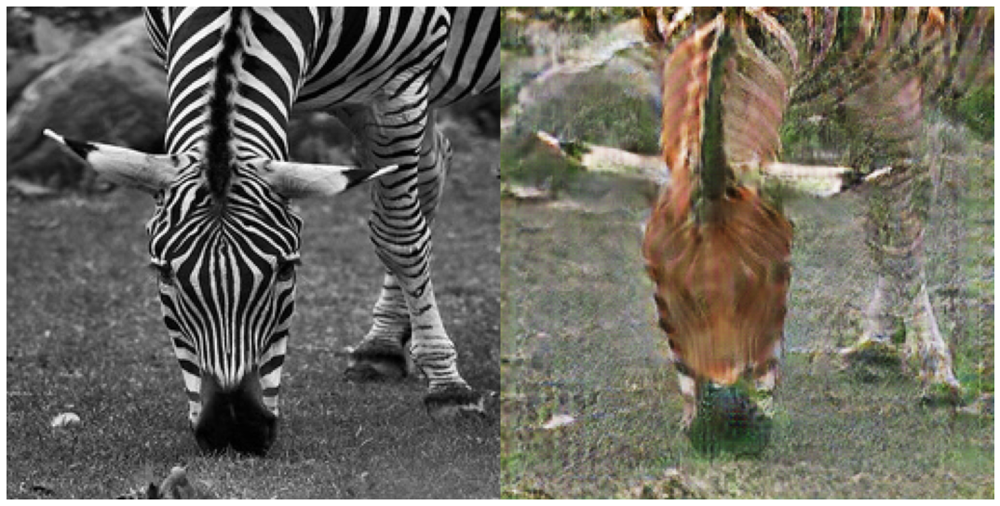

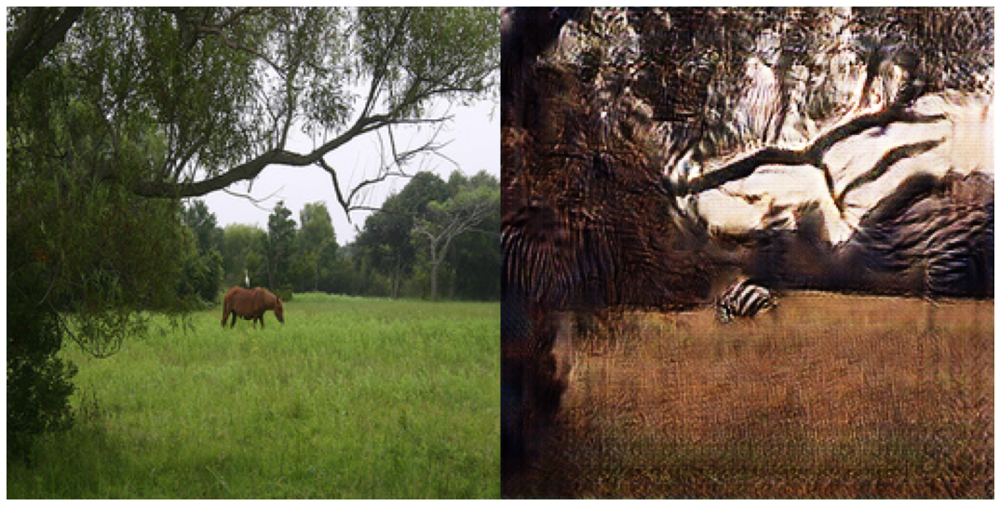

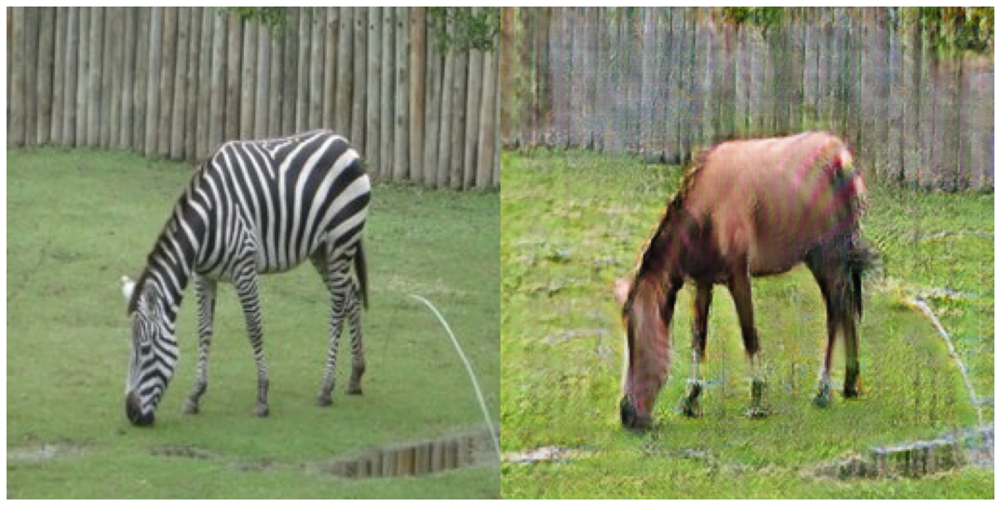

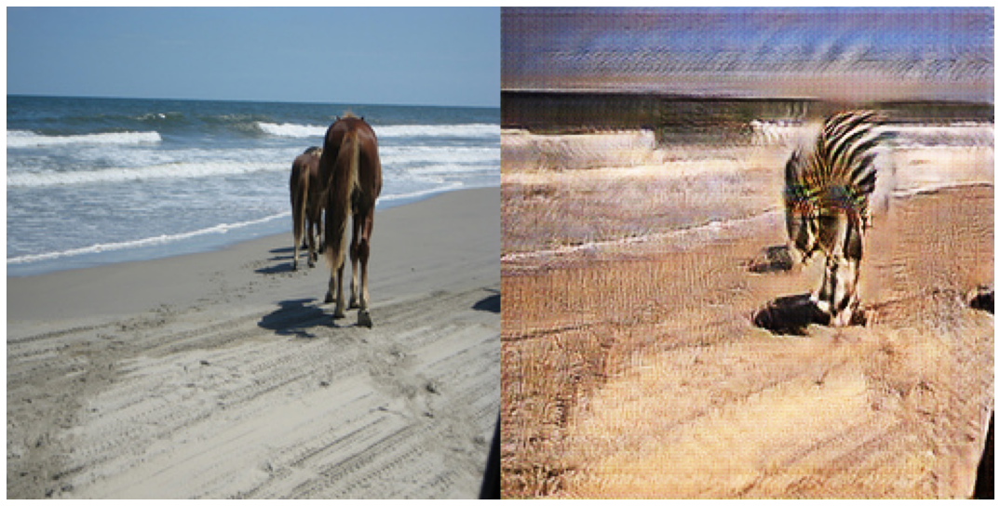

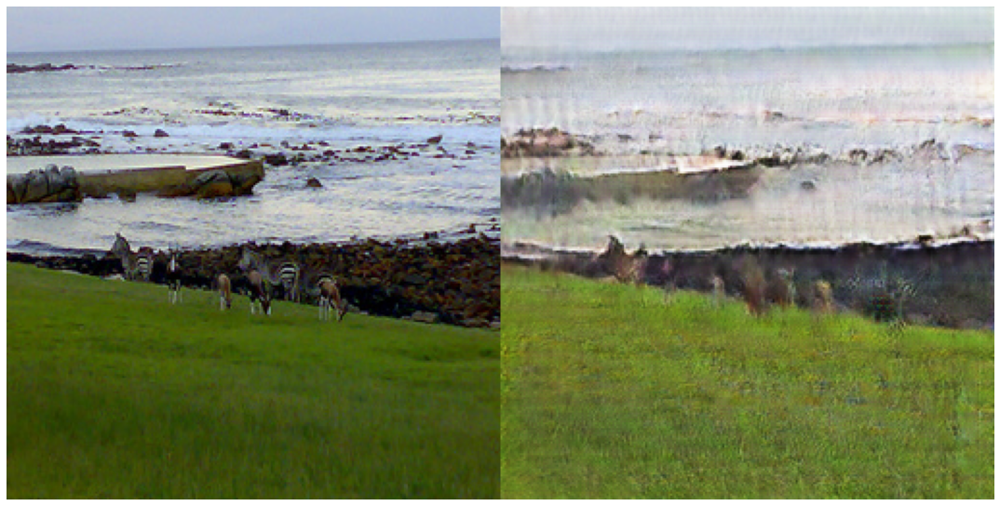

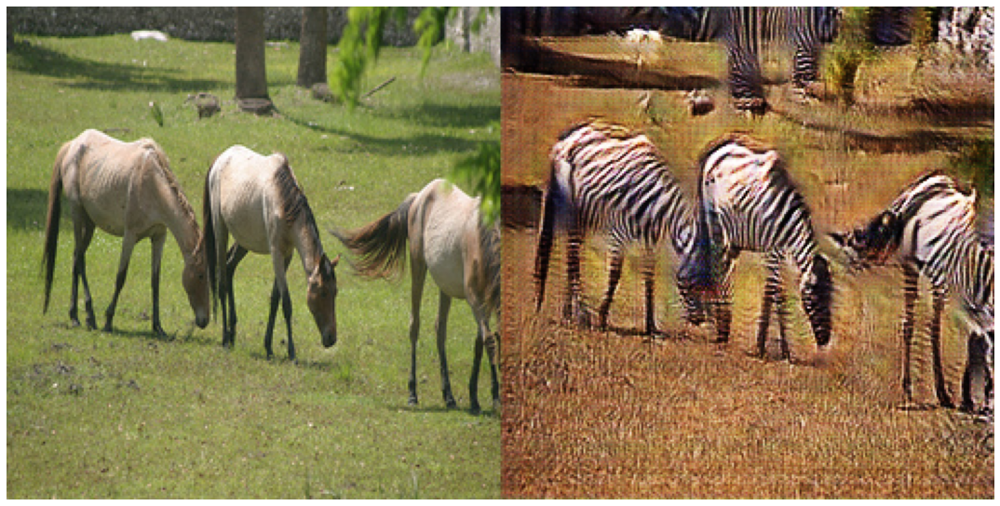

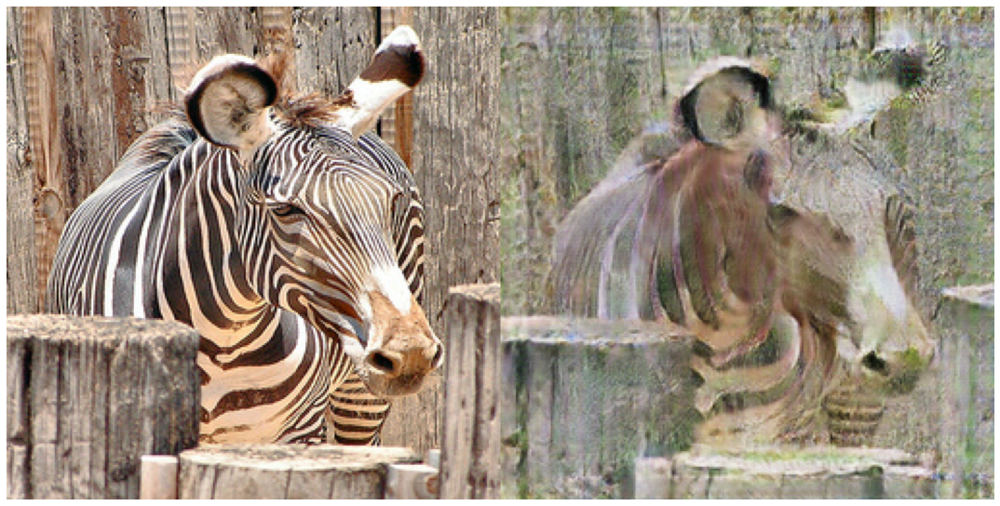

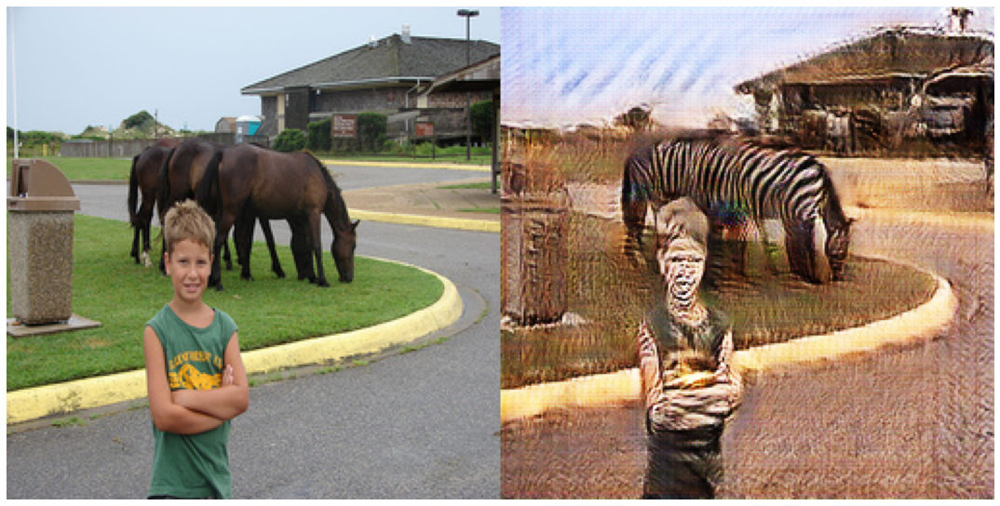

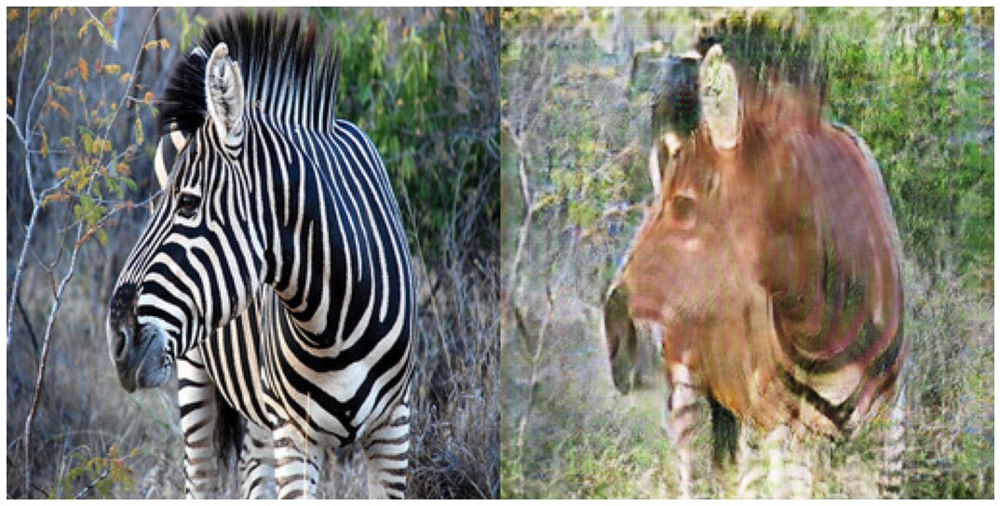

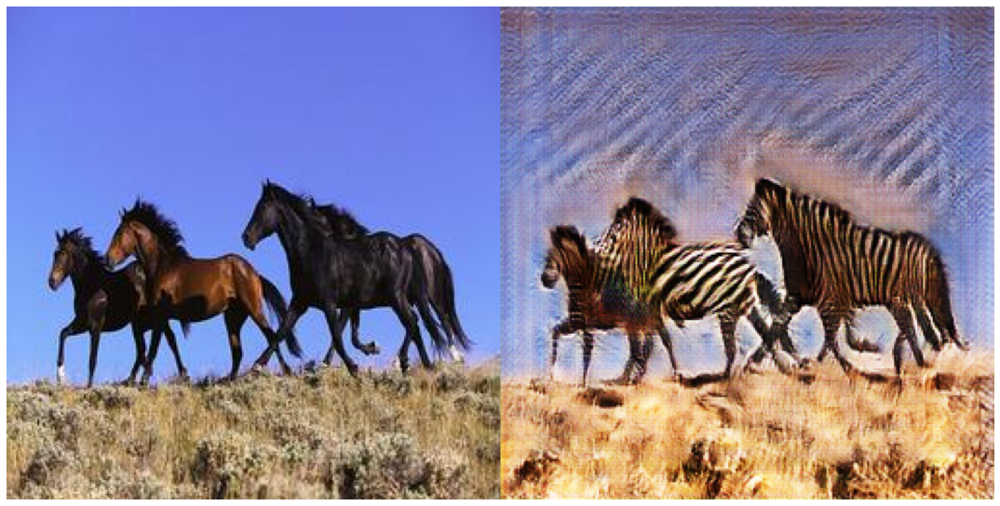

In [21]:
G.eval()
F.eval()
for i in range(5):
    x, y = next(iter(images_loader))
    x, y = x.cuda(), y.cuda()
    
    fake_x = F(y) 
    fake_y = G(x)
    
    cycle_x = F(fake_y)
    cycle_y = G(fake_x)
    
    concat_img(torch.cat((y[:1], fake_x[:1]), 0))
    concat_img(torch.cat((x[:1], fake_y[:1]), 0))
    plt.show()

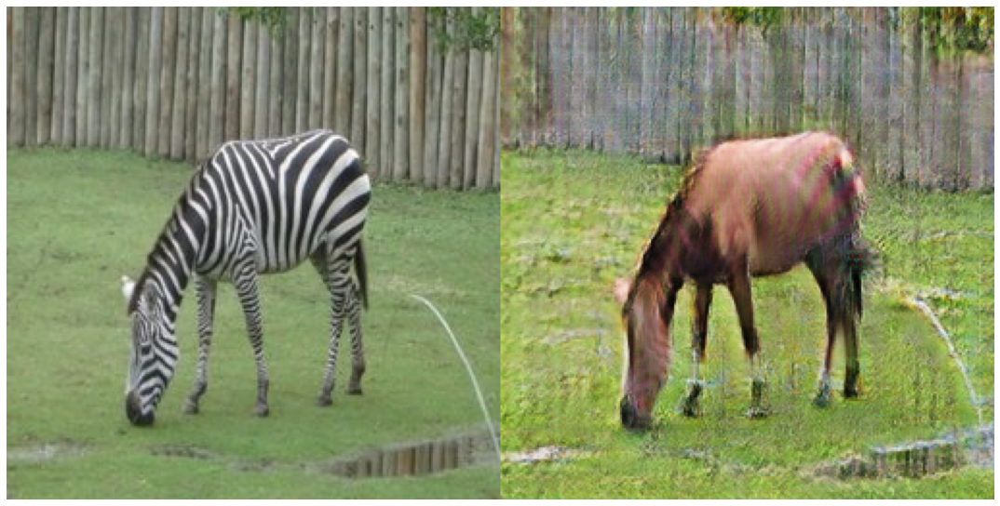

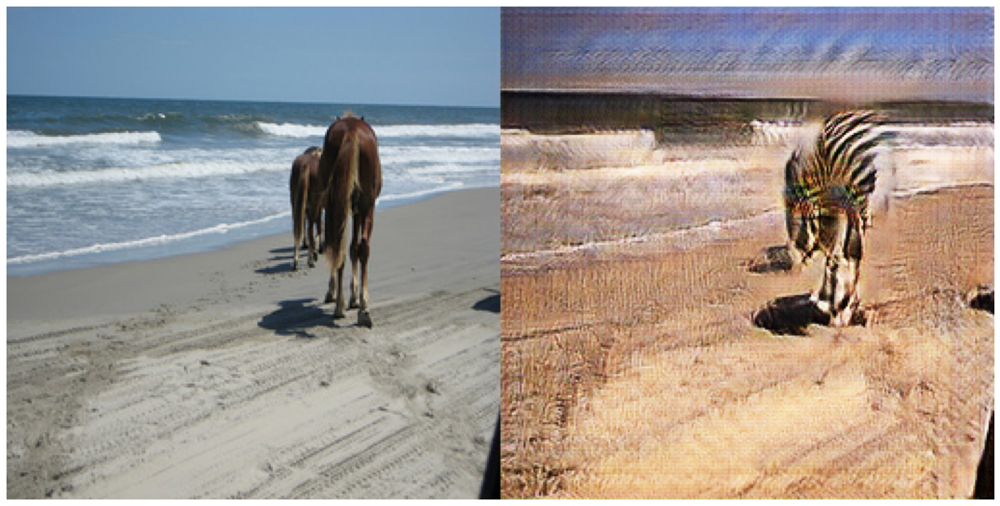

In [69]:
# Cherrypicking
x, y = next(iter(images_loader))
x, y = x.cuda(), y.cuda()
    
fake_x = F(y) 
fake_y = G(x)

cycle_x = F(fake_y)
cycle_y = G(fake_x)
    
concat_img(torch.cat((y[:1], fake_x[:1]), 0))
plt.savefig('zebra_result4.png')
concat_img(torch.cat((x[:1], fake_y[:1]), 0))
plt.savefig('horse_result4.png')